In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [2]:
import pandas as pd
import re
import torch
from transformers import AutoTokenizer, AutoModel
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, f1_score, multilabel_confusion_matrix

In [3]:
from torch import cuda
device = 'cuda' if cuda.is_available() else 'cpu'
device

'cpu'

In [4]:
train_data  = pd.read_csv('Poem_classification - train_data.csv')
train_data.head()

,Genre,Poem
0,Music,NaN
1,Music,In the thick brushthey spend the...
2,Music,Storms are generous. ...
3,Music,—After Ana Mendieta Did you carry around the ...
4,Music,for Aja Sherrard at 20The portent may itself ...


In [5]:
train_data.describe()

,Genre,Poem
count,841,837
unique,4,785
top,Music,We walk through clouds wrapped in ancient symb...
freq,239,3


In [6]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 841 entries, 0 to 840
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Genre   841 non-null    object
 1   Poem    837 non-null    object
dtypes: object(2)
memory usage: 13.3+ KB


In [7]:
train_data.dropna(inplace=True)
train_data.reset_index(drop=True, inplace=True)

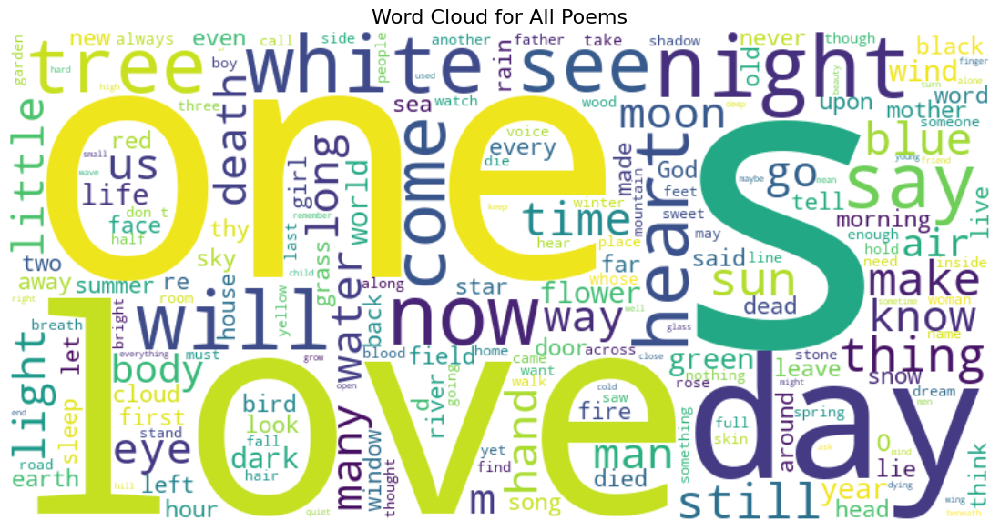

In [8]:
# Import necessary libraries
import numpy as np
import pandas as pd
import re
from collections import Counter
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud
from sklearn.feature_extraction.text import TfidfVectorizer
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
import plotly.express as px
from transformers import AutoTokenizer, AutoModel
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, f1_score, multilabel_confusion_matrix
from torch import cuda
import nltk

# Word Cloud for All Poems
all_poems = ' '.join(train_data['Poem'])
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_poems)

plt.figure(figsize=(15, 7))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud for All Poems', fontsize=16)
plt.show()

In [9]:
contractions_dict = { "ain't": "are not","'s":" is","aren't": "are not",
                     "can't": "cannot","can't've": "cannot have",
                     "'cause": "because","could've": "could have","couldn't": "could not",
                     "couldn't've": "could not have", "didn't": "did not","doesn't": "does not",
                     "don't": "do not","hadn't": "had not","hadn't've": "had not have",
                     "hasn't": "has not","haven't": "have not","he'd": "he would",
                     "he'd've": "he would have","he'll": "he will", "he'll've": "he will have",
                     "how'd": "how did","how'd'y": "how do you","how'll": "how will",
                     "I'd": "I would", "I'd've": "I would have","I'll": "I will",
                     "I'll've": "I will have","I'm": "I am","I've": "I have", "isn't": "is not",
                     "it'd": "it would","it'd've": "it would have","it'll": "it will",
                     "it'll've": "it will have", "let's": "let us","ma'am": "madam",
                     "mayn't": "may not","might've": "might have","mightn't": "might not", 
                     "mightn't've": "might not have","must've": "must have","mustn't": "must not",
                     "mustn't've": "must not have", "needn't": "need not",
                     "needn't've": "need not have","o'clock": "of the clock","oughtn't": "ought not",
                     "oughtn't've": "ought not have","shan't": "shall not","sha'n't": "shall not",
                     "shan't've": "shall not have","she'd": "she would","she'd've": "she would have",
                     "she'll": "she will", "she'll've": "she will have","should've": "should have",
                     "shouldn't": "should not", "shouldn't've": "should not have","so've": "so have",
                     "that'd": "that would","that'd've": "that would have", "there'd": "there would",
                     "there'd've": "there would have", "they'd": "they would",
                     "they'd've": "they would have","they'll": "they will",
                     "they'll've": "they will have", "they're": "they are","they've": "they have",
                     "to've": "to have","wasn't": "was not","we'd": "we would",
                     "we'd've": "we would have","we'll": "we will","we'll've": "we will have",
                     "we're": "we are","we've": "we have", "weren't": "were not","what'll": "what will",
                     "what'll've": "what will have","what're": "what are", "what've": "what have",
                     "when've": "when have","where'd": "where did", "where've": "where have",
                     "who'll": "who will","who'll've": "who will have","who've": "who have",
                     "why've": "why have","will've": "will have","won't": "will not",
                     "won't've": "will not have", "would've": "would have","wouldn't": "would not",
                     "wouldn't've": "would not have","y'all": "you all", "y'all'd": "you all would",
                     "y'all'd've": "you all would have","y'all're": "you all are",
                     "y'all've": "you all have", "you'd": "you would","you'd've": "you would have",
                     "you'll": "you will","you'll've": "you will have", "you're": "you are",
                     "you've": "you have"}
contractions_re=re.compile('(%s)' % '|'.join(contractions_dict.keys()))

# Function for expanding contractions
def expand_contractions(text,contractions_dict=contractions_dict):
  def replace(match):
    return contractions_dict[match.group(0)]
  return contractions_re.sub(replace, text)

In [10]:
train_data['Poem'] = train_data['Poem'].apply(lambda x: str(x).lower())
train_data['Poem'] = train_data['Poem'].apply(lambda X: expand_contractions(X)) 
train_data['Poem'] = train_data['Poem'].apply(lambda x: re.sub('[^\w\s]|_','', x))

In [11]:
category = train_data.loc[:, "Genre"].unique()

In [12]:
encode_dict = {}

def encode_cat(x):
    if x not in encode_dict.keys():
        encode_dict[x]=len(encode_dict)
    return encode_dict[x]

In [13]:
train_data["ENCODE_CAT"] = train_data['Genre'].apply(lambda x: encode_cat(x))
train_data

,Genre,Poem,ENCODE_CAT
0,Music,in the thick brushthey spend the...,0
1,Music,storms are generous ...,0
2,Music,after ana mendieta did you carry around the m...,0
3,Music,for aja sherrard at 20the portent may itself ...,0
4,Music,for bob marley bavaria november 1980 here is ...,0
...,...,...,...
832,Environment,why make so much of fragmentary blue in here a...,3
833,Environment,woman i wish i did not know your name what cou...,3
834,Environment,yonder to the kiosk beside the creek paddle th...,3
835,Environment,you come to fetch me from my work tonight when...,3


In [14]:
# Creating the dataset and dataloader for the neural network

train_size = 0.7 
train_dataset=train_data.sample(frac=train_size,random_state=200)
test_dataset=train_data.drop(train_dataset.index).reset_index(drop=True)
train_dataset = train_dataset.reset_index(drop=True)

print("FULL Dataset: {}".format(train_data.shape))
print("TRAIN Dataset: {}".format(train_dataset.shape))
print("TEST Dataset: {}".format(test_dataset.shape))

FULL Dataset: (837, 3)
TRAIN Dataset: (586, 3)
TEST Dataset: (251, 3)


In [15]:
from transformers import AutoTokenizer, AutoModel

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

tokenizer = AutoTokenizer.from_pretrained("distilbert-base-uncased")
model = AutoModel.from_pretrained("distilbert-base-uncased").to(device)

In [16]:
tokenized_train = tokenizer(train_data["Poem"].values.tolist(), padding = True, truncation = True, max_length=128, return_tensors="pt")
tokenized_val = tokenizer(test_dataset["Poem"].values.tolist() , padding = True, truncation = True,  max_length=128, return_tensors="pt")

print(tokenized_train.keys())

#move on device (GPU)
tokenized_train = {k:torch.tensor(v).to(device) for k,v in tokenized_train.items()}
tokenized_val = {k:torch.tensor(v).to(device) for k,v in tokenized_val.items()}
with torch.no_grad():
  hidden_train = model(**tokenized_train) #dim : [batch_size(nr_sentences), tokens, emb_dim]
  hidden_val = model(**tokenized_val)

#get only the [CLS] hidden states
cls_train = hidden_train.last_hidden_state[:,0,:]
cls_val = hidden_val.last_hidden_state[:,0,:]

x_train = cls_train.to("cpu")
y_train = train_data["ENCODE_CAT"]

x_val = cls_val.to("cpu")
y_val = test_dataset["ENCODE_CAT"]

print(x_train.shape, y_train.shape, x_val.shape, y_val.shape)

dict_keys(['input_ids', 'attention_mask'])


C:\Users\debbi\AppData\Local\Temp\ipykernel_49864\3280566621.py:7: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  tokenized_train = {k:torch.tensor(v).to(device) for k,v in tokenized_train.items()}
C:\Users\debbi\AppData\Local\Temp\ipykernel_49864\3280566621.py:8: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  tokenized_val = {k:torch.tensor(v).to(device) for k,v in tokenized_val.items()}


torch.Size([837, 768]) (837,) torch.Size([251, 768]) (251,)


In [17]:
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score

# Initialize the model
model = XGBClassifier(
    max_depth=5,
    learning_rate=0.05,
    n_estimators=100,  
    subsample=0.8,
    colsample_bytree=0.8,
    gamma=0.1,
    objective="multi:softmax",
    num_class=len(train_data['Genre'].unique()),
)

model.fit(x_train, y_train)

# Evaluate the model
y_pred = model.predict(x_val)
accuracy = accuracy_score(y_val, y_pred)
print("Accuracy: %.2f%%" % (accuracy * 100.0))

Accuracy: 94.42%


In [18]:
model.save_model("xgboost_model.json")

print("Model saved successfully!")

Model saved successfully!


In [19]:
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix, classification_report

# Step 1: Predict on the validation data
y_pred = model.predict(x_val)

# Step 2: Compute validation accuracy
accuracy = accuracy_score(y_val, y_pred)
print("Validation Accuracy: %.2f%%" % (accuracy * 100.0))

# Step 3: Compute the F1-score (weighted for multi-class classification)
f1 = f1_score(y_val, y_pred, average='weighted')
print("Validation F1-Score: %.2f" % f1)

# Step 4: Generate the confusion matrix
cm = confusion_matrix(y_val, y_pred)
print("Confusion Matrix:\n", cm)

# Step 5: Classification report (precision, recall, F1-score per class)
report = classification_report(y_val, y_pred, target_names=train_data['Genre'].unique())
print("Classification Report:\n", report)

Validation Accuracy: 94.42%
Validation F1-Score: 0.94
Confusion Matrix:
 [[81  2  0  0]
 [ 4 62  0  1]
 [ 3  1 35  0]
 [ 3  0  0 59]]
Classification Report:
               precision    recall  f1-score   support

       Music       0.89      0.98      0.93        83
       Death       0.95      0.93      0.94        67
   Affection       1.00      0.90      0.95        39
 Environment       0.98      0.95      0.97        62

    accuracy                           0.94       251
   macro avg       0.96      0.94      0.95       251
weighted avg       0.95      0.94      0.94       251



In [21]:
import xgboost as xgb

# Train the model
# model = XGBClassifier()
# model.fit(x_train, y_train)

# Save the trained model to a file
model.save_model("xgboost_model.json")

print("Model saved successfully!")

Model saved successfully!


In [22]:
# Load the saved model
loaded_model = xgb.XGBClassifier()
loaded_model.load_model("xgboost_model.json")

print("Model loaded successfully!")

Model loaded successfully!


In [23]:
# Make predictions with the loaded model
y_pred_loaded = loaded_model.predict(x_val)
predictions_loaded = [round(value) for value in y_pred_loaded]

# Evaluate predictions
accuracy_loaded = accuracy_score(y_val, predictions_loaded)
print("Accuracy of loaded model: %.2f%%" % (accuracy_loaded * 100.0))

Accuracy of loaded model: 94.42%


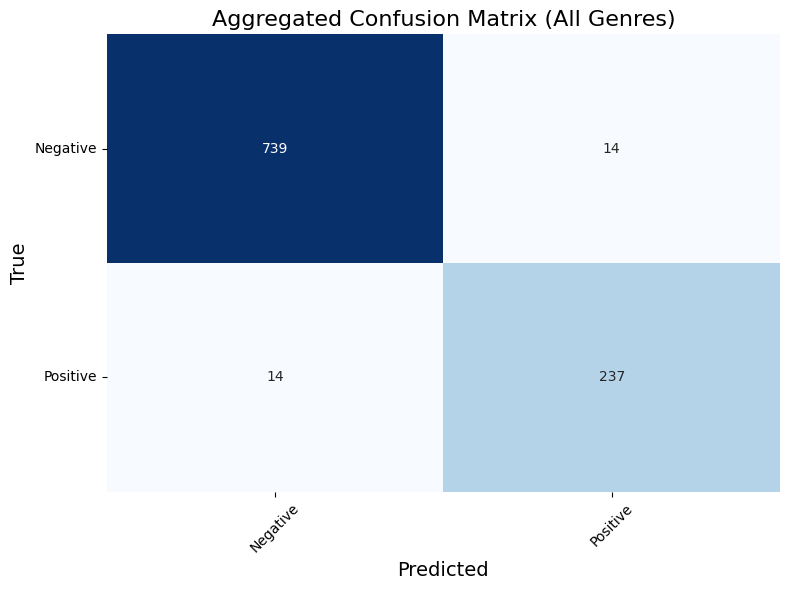

In [24]:
# Generate the confusion matrices
conf_matrices = multilabel_confusion_matrix(y_val, y_pred)

# Aggregate confusion matrices into a single matrix
# Sum up the True Negatives (TN), False Positives (FP), False Negatives (FN), and True Positives (TP) across all genres
tn = np.sum(conf_matrices[:, 0, 0])  # Sum of True Negatives
fp = np.sum(conf_matrices[:, 0, 1])  # Sum of False Positives
fn = np.sum(conf_matrices[:, 1, 0])  # Sum of False Negatives
tp = np.sum(conf_matrices[:, 1, 1])  # Sum of True Positives

# Create the aggregated confusion matrix
aggregated_cm = np.array([[tn, fp], [fn, tp]])

# Plot the heatmap for the aggregated confusion matrix
plt.figure(figsize=(8, 6))  # Adjust the figure size for a single heatmap
sns.heatmap(aggregated_cm, annot=True, fmt='d', cmap='Blues', cbar=False)

# Add labels and title
plt.title('Aggregated Confusion Matrix (All Genres)', fontsize=16)
plt.xlabel('Predicted', fontsize=14)
plt.ylabel('True', fontsize=14)
plt.xticks([0.5, 1.5], ['Negative', 'Positive'], rotation=45)  # Label x-axis
plt.yticks([0.5, 1.5], ['Negative', 'Positive'], rotation=0)   # Label y-axis

plt.tight_layout()
plt.show()

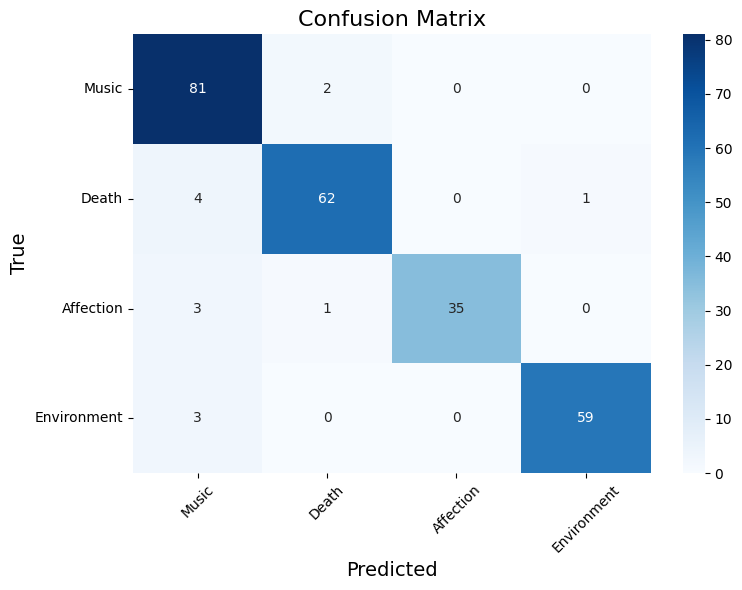

In [25]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

# Assuming `y_val` contains the true labels and `y_pred` contains the predicted labels
cm = confusion_matrix(y_val, y_pred)

# Get unique genres (classes)
genres = train_data['Genre'].unique()

# Create a DataFrame for the confusion matrix with genre names
cm_df = pd.DataFrame(cm, index=genres, columns=genres)

# Plot the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm_df, annot=True, fmt='d', cmap='Blues', cbar=True)
plt.title('Confusion Matrix', fontsize=16)
plt.xlabel('Predicted', fontsize=14)
plt.ylabel('True', fontsize=14)
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

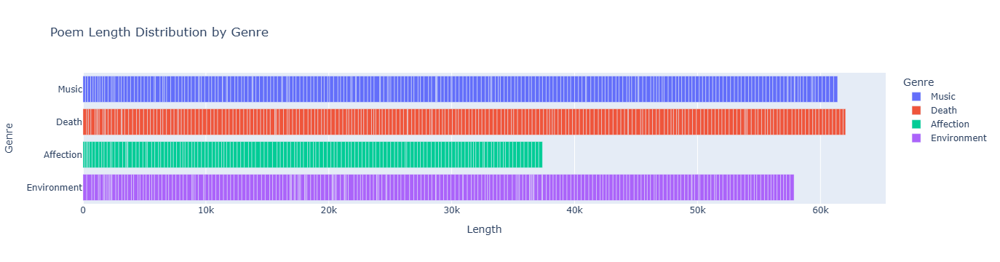

In [26]:
# EDA - Poem Length Visualization
train_data['Length'] = train_data['Poem'].apply(len)
test_dataset['Length'] = test_dataset['Poem'].apply(len)

fig = px.bar(train_data, x='Length', y='Genre', color='Genre', title="Poem Length Distribution by Genre")
fig.show()

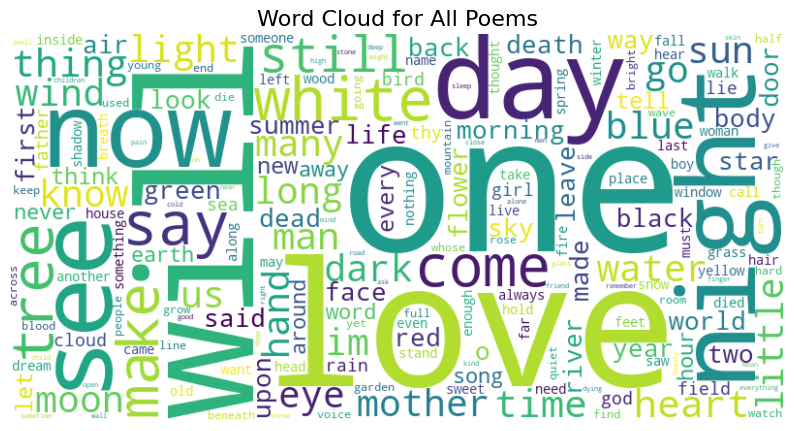

In [27]:
# Import necessary libraries
import numpy as np
import pandas as pd
import re
from collections import Counter
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud
from sklearn.feature_extraction.text import TfidfVectorizer
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
import plotly.express as px
from transformers import AutoTokenizer, AutoModel
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, f1_score, multilabel_confusion_matrix
from torch import cuda
import nltk

# Word Cloud for All Poems
all_poems = ' '.join(train_data['Poem'])
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_poems)

plt.figure(figsize=(10, 7))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud for All Poems', fontsize=16)
plt.show()

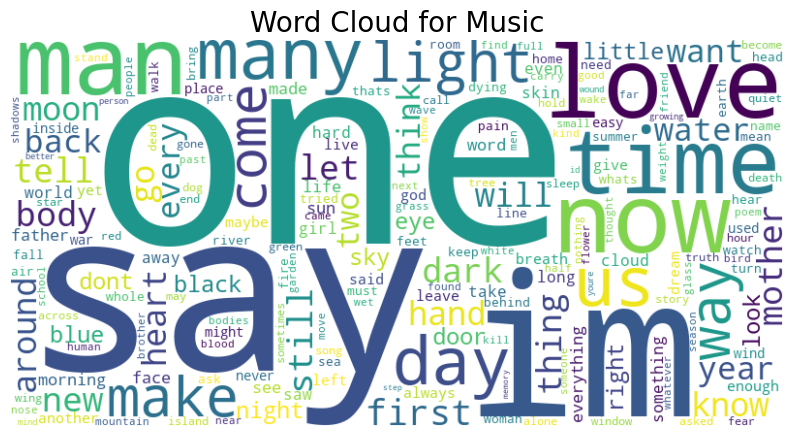

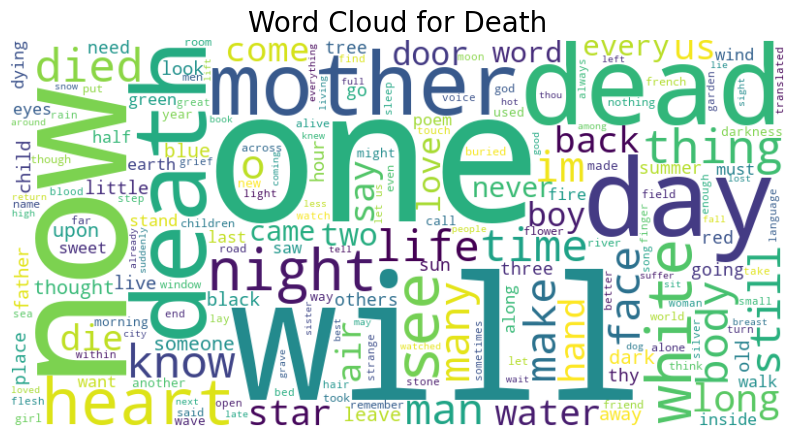

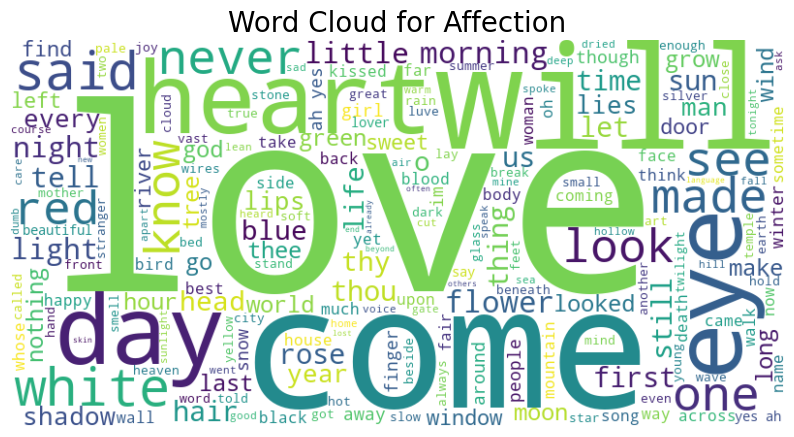

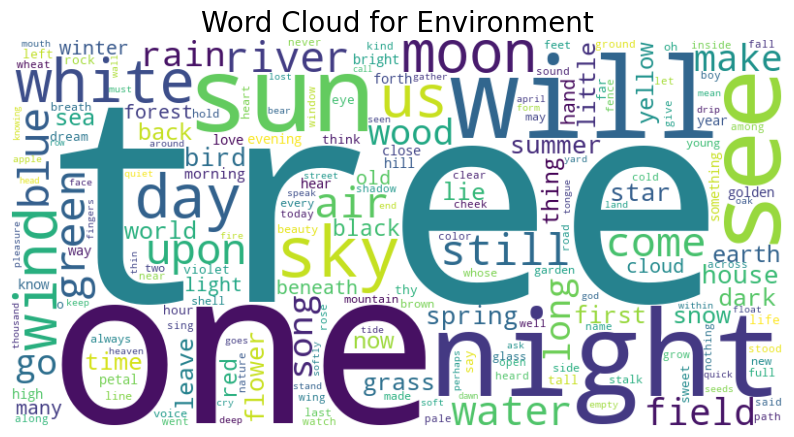

In [28]:
# Word Cloud for Each Genre
genres = train_data['Genre'].unique()
for genre in genres:
    genre_poems = ' '.join(train_data[train_data['Genre'] == genre]['Poem'])
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(genre_poems)
    
    plt.figure(figsize=(10, 7))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Word Cloud for {genre}', fontsize=20)
    plt.show()

C:\Users\debbi\AppData\Local\Temp\ipykernel_49864\3917121822.py:25: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




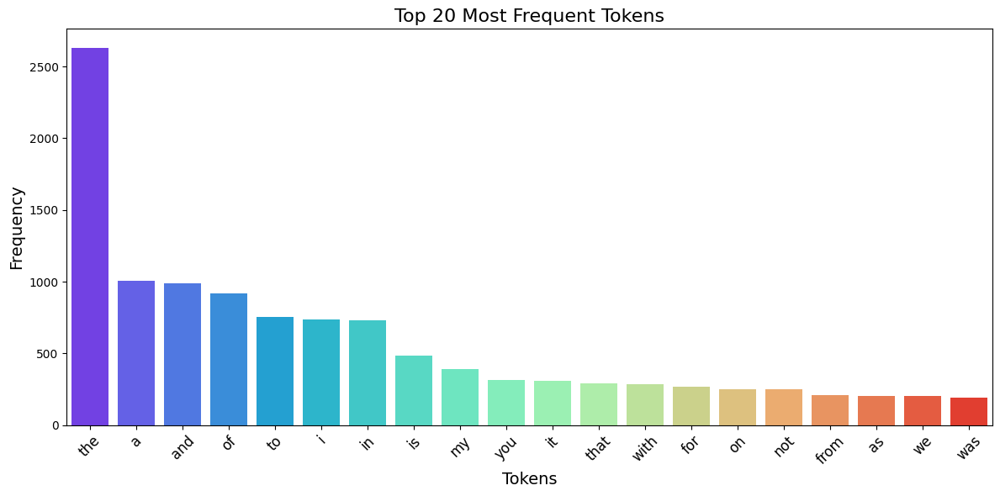

In [29]:
from collections import Counter
from nltk.tokenize import word_tokenize
import matplotlib.pyplot as plt
import seaborn as sns

# Token Frequency Graphic (Top 20 Tokens)
def token_frequency_graphic(text_collection, n_largest):
    # Combine all poems into a single text
    all_words = ' '.join(text_collection)
    
    # Tokenize the text
    tokens = word_tokenize(all_words)
    
    # Count token frequencies
    frequency = Counter(tokens)
    
    # Convert to DataFrame
    frequency_df = pd.DataFrame({
        'word': list(frequency.keys()),
        'frequency': list(frequency.values())
    })
    
    # Plot the top N most frequent tokens
    plt.figure(figsize=(12, 6))
    sns.barplot(data=frequency_df.nlargest(n_largest, 'frequency'), x='word', y='frequency', palette='rainbow')
    plt.title(f'Top {n_largest} Most Frequent Tokens', fontsize=16)
    plt.xlabel('Tokens', fontsize=14)
    plt.ylabel('Frequency', fontsize=14)
    plt.xticks(rotation=45, fontsize=12)
    plt.tight_layout()
    plt.show()

# Generate token frequency graphic
token_frequency_graphic(train_data['Poem'], n_largest=20)

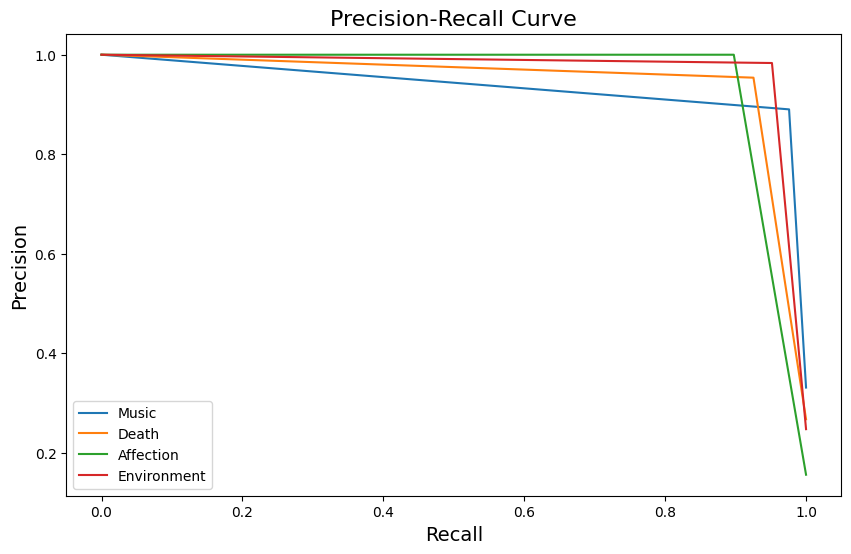

In [30]:
from sklearn.metrics import precision_recall_curve
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt

# Binarize the labels for multi-class evaluation
y_val_bin = label_binarize(y_val, classes=range(len(train_data['Genre'].unique())))
y_pred_bin = label_binarize(y_pred, classes=range(len(train_data['Genre'].unique())))

# Plot precision-recall curve for each class
plt.figure(figsize=(10, 6))
for i, genre in enumerate(train_data['Genre'].unique()):
    precision, recall, _ = precision_recall_curve(y_val_bin[:, i], y_pred_bin[:, i])
    plt.plot(recall, precision, label=f'{genre}')

plt.title("Precision-Recall Curve", fontsize=16)
plt.xlabel("Recall", fontsize=14)
plt.ylabel("Precision", fontsize=14)
plt.legend(loc="lower left")
plt.show()

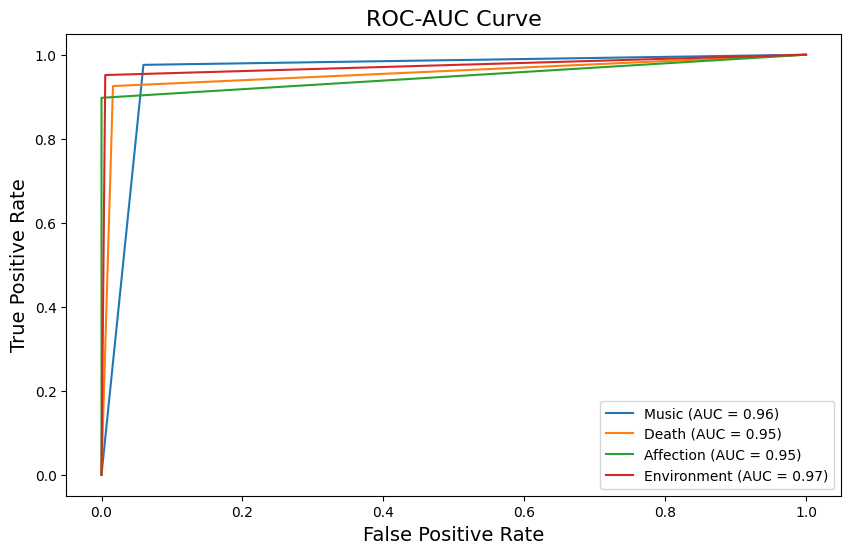

In [31]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt

# Binarize the labels for multi-class evaluation
y_val_bin = label_binarize(y_val, classes=range(len(train_data['Genre'].unique())))
y_pred_bin = label_binarize(y_pred, classes=range(len(train_data['Genre'].unique())))

# Plot ROC curve for each class
plt.figure(figsize=(10, 6))
for i, genre in enumerate(train_data['Genre'].unique()):
    fpr, tpr, _ = roc_curve(y_val_bin[:, i], y_pred_bin[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'{genre} (AUC = {roc_auc:.2f})')

plt.title("ROC-AUC Curve", fontsize=16)
plt.xlabel("False Positive Rate", fontsize=14)
plt.ylabel("True Positive Rate", fontsize=14)
plt.legend(loc="lower right")
plt.show()

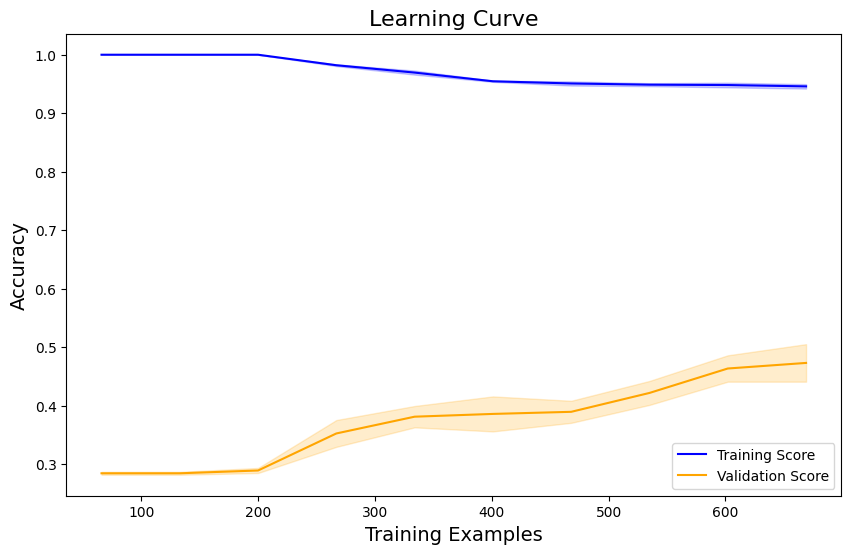

In [32]:
from sklearn.model_selection import learning_curve
import numpy as np
from sklearn.base import clone

# Clone the model to ensure it's clean and serializable
cloned_model = clone(model)

# Reduce parallelism to avoid memory issues
train_sizes, train_scores, val_scores = learning_curve(
    cloned_model, x_train, y_train, cv=5, scoring='accuracy', n_jobs=1,
    train_sizes=np.linspace(0.1, 1.0, 10)
)

# Calculate mean and standard deviation
train_mean = np.mean(train_scores, axis=1)
val_mean = np.mean(val_scores, axis=1)
train_std = np.std(train_scores, axis=1)
val_std = np.std(val_scores, axis=1)

# Plot the learning curve
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_mean, label="Training Score", color="blue")
plt.plot(train_sizes, val_mean, label="Validation Score", color="orange")
plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, alpha=0.2, color="blue")
plt.fill_between(train_sizes, val_mean - val_std, val_mean + val_std, alpha=0.2, color="orange")
plt.title("Learning Curve", fontsize=16)
plt.xlabel("Training Examples", fontsize=14)
plt.ylabel("Accuracy", fontsize=14)
plt.legend(loc="best")
plt.show()

In [37]:
import torch
from transformers import AutoTokenizer, AutoModel
import xgboost as xgb

loaded_model = xgb.Booster()
loaded_model.load_model("xgboost_model.json")

# Load the DistilBERT tokenizer and model
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
tokenizer = AutoTokenizer.from_pretrained("distilbert-base-uncased")
model = AutoModel.from_pretrained("distilbert-base-uncased").to(device)

categories = ["Music", "Death", "Affection", "Environment"]

print("Model and tokenizer loaded successfully!")

def preprocess_poem(poem):
    # Tokenize the poem
    tokenized_input = tokenizer(
        poem,
        padding=True,
        truncation=True,
        max_length=128,
        return_tensors="pt"
    )
    
    # Move tensors to the appropriate device (GPU or CPU)
    tokenized_input = {k: v.to(device) for k, v in tokenized_input.items()}
    
    # Get the hidden states from the DistilBERT model
    with torch.no_grad():
        hidden_states = model(**tokenized_input)
    
    # Extract the [CLS] token's hidden state
    cls_embedding = hidden_states.last_hidden_state[:, 0, :].to("cpu").numpy()
    
    return cls_embedding

def predict_with_poem_input():
    print("Please enter a poem for prediction:")
    
    poem_input = input("Poem: ")
    
    try:
        # Preprocess the poem using the DistilBERT tokenizer and model
        cls_embedding = preprocess_poem(poem_input)
        
        # Convert the embedding to a DMatrix 
        input_matrix = xgb.DMatrix(cls_embedding)
        
        # Make the prediction using the loaded XGBoost model
        prediction = loaded_model.predict(input_matrix)
        
        # Map the numeric prediction to the corresponding category
        predicted_category = categories[int(prediction[0])]
        
        print(f"The model predicts the poem belongs to the category: {predicted_category}")
    
    except Exception as e:
        print(f"An error occurred: {e}")

predict_with_poem_input()

Model and tokenizer loaded successfully!
Please enter a poem for prediction:


Poem:  The drum's heartbeat, the flute's sweet sigh, A melody lifting to the sky. In every chord, a story's told, Music speaks what words can't hold.


The model predicts the poem belongs to the category: Music


In [38]:
import torch
from transformers import AutoTokenizer, AutoModel
import xgboost as xgb

loaded_model = xgb.Booster()
loaded_model.load_model("xgboost_model.json")

# Load the DistilBERT tokenizer and model
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
tokenizer = AutoTokenizer.from_pretrained("distilbert-base-uncased")
model = AutoModel.from_pretrained("distilbert-base-uncased").to(device)

categories = ["Music", "Death", "Affection", "Environment"]

print("Model and tokenizer loaded successfully!")

def preprocess_poem(poem):
    # Tokenize the poem
    tokenized_input = tokenizer(
        poem,
        padding=True,
        truncation=True,
        max_length=128,
        return_tensors="pt"
    )
    
    # Move tensors to the appropriate device (GPU or CPU)
    tokenized_input = {k: v.to(device) for k, v in tokenized_input.items()}
    
    # Get the hidden states from the DistilBERT model
    with torch.no_grad():
        hidden_states = model(**tokenized_input)
    
    # Extract the [CLS] token's hidden state
    cls_embedding = hidden_states.last_hidden_state[:, 0, :].to("cpu").numpy()
    
    return cls_embedding

def predict_with_poem_input():
    print("Please enter a poem for prediction:")
    
    poem_input = input("Poem: ")
    
    try:
        # Preprocess the poem using the DistilBERT tokenizer and model
        cls_embedding = preprocess_poem(poem_input)
        
        # Convert the embedding to a DMatrix 
        input_matrix = xgb.DMatrix(cls_embedding)
        
        # Make the prediction using the loaded XGBoost model
        prediction = loaded_model.predict(input_matrix)
        
        # Map the numeric prediction to the corresponding category
        predicted_category = categories[int(prediction[0])]
        
        print(f"The model predicts the poem belongs to the category: {predicted_category}")
    
    except Exception as e:
        print(f"An error occurred: {e}")

predict_with_poem_input()

Model and tokenizer loaded successfully!
Please enter a poem for prediction:


Poem:  Beneath the veil of twilight's hue, The stars whisper what life once knew. A quiet peace, a solemn call, In death's embrace, we rest with all.  No more pain, no fleeting strife, Only stillness after life. Yet in each heart, a memory stays, A gentle echo through endless days.


The model predicts the poem belongs to the category: Environment
